# Pandas version of the code in "R for Marketing Research and Analytics"

## Ch 3 - Simulating data and plotting

### Jupyter template stuff

In [1]:
from IPython.core.interactiveshell import InteractiveShell

# pretty print only the last output of the cell
#InteractiveShell.ast_node_interactivity = "last_expr"
# pretty print all cell's output and not just the last one
InteractiveShell.ast_node_interactivity = "all"

In [2]:
from IPython.display import Markdown, display
def printmd(string, color=None):
    if color:
        colorstr = "<span style='color:{}'>{}</span>".format(color, string)
        display(Markdown(colorstr))
    else:
        display(Markdown(string))

#printmd("## title text")
#printmd("**bold text**")
#printmd("**bold and blue**", color="blue")

In [3]:
%matplotlib inline

import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import json
import seaborn as sns
import plotly.plotly as py
import plotly
plotly.offline.init_notebook_mode() # run at the start of every notebook
import scipy
import statsmodels.api as sm # statistical modeling
import altair as alt
import vega_datasets

print(plt.style.available)
plt.style.use('ggplot')

plt.rcParams['figure.figsize'] = 8, 4

['Solarize_Light2', '_classic_test', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-bright', 'seaborn-colorblind', 'seaborn-dark-palette', 'seaborn-dark', 'seaborn-darkgrid', 'seaborn-deep', 'seaborn-muted', 'seaborn-notebook', 'seaborn-paper', 'seaborn-pastel', 'seaborn-poster', 'seaborn-talk', 'seaborn-ticks', 'seaborn-white', 'seaborn-whitegrid', 'seaborn', 'tableau-colorblind10']


### Simulate Data

(Note -- "One command" alternative section below is a more pythonic/pandas-appropriate way to do all this.  But I have also included a walkthru below it that mirrors the process in the original book.)

In [4]:
#define constants
k_stores = 20  # 20 stores, using "k_" for "constant"
k_years = 2
k_weeks_per_year = 52   
k_start_year = 2013

# One command (almost) alternative for all steps

In [5]:
start_date = str(k_start_year) + '0101' # this will result in '20130101'
start_date
dates = pd.date_range(start_date, periods=k_weeks_per_year * k_years, freq='W')
#years_old = pd.date_range('2013', periods=k_years, freq='Y')
print(dates)
# specify the seed to make test results repeatable
np.random.seed(98250)
# randomly select weeks that products p1 and p2 were promoted. The vars specify how often they are promoted
p1_promo_rate = 0.1
p2_promo_rate = 0.15
# randomly select one of five prices by sampling with replacement
p1_possible_prices = [2.19, 2.29, 2.49, 2.79, 2.99]
p2_possible_prices = [2.29, 2.49, 2.59, 2.99, 3.19]
# Randomly generate sales (unit sales) data.  Use Poisson with lambda=mean weekly sales
p1_mean_weekly_sales = 120
p2_mean_weekly_sales = 100

df_onecommand = pd.DataFrame(data= {'storeNum': [num for num in range(101,100+k_stores+1)] * k_weeks_per_year * k_years,
                                    'country': (["US"]*3 + ["DE"]*5 + ["GB"]*3 + ["BR"]*2 + ["JP"]*4 + ["AU"]*1 + ["CN"]*2) * k_weeks_per_year * k_years,
#                                    'Date': np.tile(dates, k_stores),
#                                    'Year': np.tile(dates.year, k_stores),
#                                    'Week': np.tile(dates.week, k_stores),
                                    'Date': dates.repeat(k_stores),
                                    'Year': dates.year.repeat(k_stores),
                                    'Week': dates.week.repeat(k_stores),
                                    # these sales are just random -- we'll later tweak them to make sense given that week's pricing and promotion
                                    #         in the sales poisson, 'size'=number of draws, 'lam'=mean value of units per week
                                    'p1sales': np.random.poisson(lam=p1_mean_weekly_sales, size=k_stores * k_weeks_per_year * k_years),
                                    'p2sales': np.random.poisson(lam=p1_mean_weekly_sales, size=k_stores * k_weeks_per_year * k_years),
                                    'p1price': np.random.choice(p1_possible_prices, size=k_stores * k_weeks_per_year * k_years, replace=True),
                                    'p2price': np.random.choice(p2_possible_prices, size=k_stores * k_weeks_per_year * k_years, replace=True),
                                    'p1prom': np.random.binomial(n=1, p=p1_promo_rate, size=k_stores * k_weeks_per_year * k_years), # 1 10% of the time, 0 otherwise; repeat num_row times
                                    'p2prom': np.random.binomial(n=1, p=p2_promo_rate, size=k_stores * k_weeks_per_year * k_years),
})

# now scale the sales counts up or down according to relative price.  Price effects often
# follow a logarithmic function rather than a linear function, so we use log(price)
# we assume that sales vary as the inverse ratio of the two prices
df_onecommand.p1sales = df_onecommand.p1sales * np.log(df_onecommand.p2price) / np.log(df_onecommand.p1price)
df_onecommand.p2sales = df_onecommand.p2sales * np.log(df_onecommand.p1price) / np.log(df_onecommand.p2price)
# now assume sales get a 30% or 40% lift when each product is promoted
p1_promo_uplift = 0.3
p2_promo_uplift = 0.4
df_onecommand.p1sales = np.floor(df_onecommand.p1sales * (1 + df_onecommand.p1prom*p1_promo_uplift))
df_onecommand.p2sales = np.floor(df_onecommand.p2sales * (1 + df_onecommand.p2prom*p2_promo_uplift))

# set country as a categorical variable
df_onecommand.country = df_onecommand.country.astype('category')
# set storeeNum as categorical variable
df_onecommand.storeNum = df_onecommand.storeNum.astype('category')

df_onecommand.sample(10)
df_store = df_onecommand

'20130101'

DatetimeIndex(['2013-01-06', '2013-01-13', '2013-01-20', '2013-01-27',
               '2013-02-03', '2013-02-10', '2013-02-17', '2013-02-24',
               '2013-03-03', '2013-03-10',
               ...
               '2014-10-26', '2014-11-02', '2014-11-09', '2014-11-16',
               '2014-11-23', '2014-11-30', '2014-12-07', '2014-12-14',
               '2014-12-21', '2014-12-28'],
              dtype='datetime64[ns]', length=104, freq='W-SUN')


,storeNum,country,Date,Year,Week,p1sales,p2sales,p1price,p2price,p1prom,p2prom
1850,111,GB,2014-10-12,2014,41,136.0,121.0,2.49,2.59,0,0
382,103,US,2013-05-19,2013,20,140.0,148.0,2.29,2.59,0,1
1231,112,BR,2014-03-09,2014,10,149.0,121.0,2.79,3.19,0,0
906,107,DE,2013-11-17,2013,46,151.0,123.0,2.49,3.19,0,1
712,113,BR,2013-09-08,2013,36,177.0,127.0,2.49,2.99,0,1
187,108,DE,2013-03-10,2013,10,149.0,103.0,2.29,2.59,0,0
1036,117,JP,2013-12-29,2013,52,110.0,145.0,2.49,2.29,0,0
1925,106,DE,2014-11-09,2014,45,169.0,85.0,2.29,3.19,0,0
1171,112,BR,2014-02-16,2014,7,184.0,94.0,2.19,2.49,1,0
1689,110,GB,2014-08-17,2014,33,143.0,102.0,2.19,2.49,0,0


# Longer set of commands for simulating data (less pythonic, but more explanation)

In [15]:
# create data frame of initially missing values to hold the data
columns=['storeNum', 'Year', 'Week', 'p1sales', 'p2sales', 'p1price','p2price','p1prom','p2prom','country']
df_store = pd.DataFrame(data=np.empty(shape=(k_stores*k_weeks_per_year*k_years, len(columns))),
                        columns=columns)
df_store.tail(5)

,storeNum,Year,Week,p1sales,p2sales,p1price,p2price,p1prom,p2prom,country
2075,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2076,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2077,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2078,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2079,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [16]:
df_store.shape

(2080, 10)

### Repeating values and sequences
When simulating data, we often need to repeat values in category ("factor") columns.  This section goes through some basic python and pandas for repeating elements or sequences to do this.

In [17]:
##### Sequences ######
printmd('**Sequences** _repeated_:  Option1: python lists * x', color='blue')
# Use python list multiplication to repeat sequences
seq = ['a', 'b', 'c']
print(seq * 6)

printmd('Sequences repeated:  Option2: np.tile() on panda Series', color='blue')
# OR use np.tile to repeat sequences
np.tile(pd.Series(['a','b','c']), 6)

printmd('using * for Series ends up broadcasting math if used with Series of numbers', color='blue')
# works for integers too if a python list.  pd.Series wouldn't work here
# because the "*6" would be interpreted as an integer math with a vector
# and it would "broadcast" the 1-dimensional number 6 and multiply it by
# all the integers in the Series
seq = [1, 2, 3]
#print(seq * 6) # works with python list
print(pd.Series(seq) * 6) # doesn't work (does math instead) on panda Series

printmd('...but np.tile works for panda Series with numbers', color='blue')
# in the case of needing to repeat sequences of panda integer Series, use np.tile:
np.tile(pd.Series(seq), 6)


##### Repeating Values ######
printmd('**Individual values** _repeated_:  Option1: use np.repeat() or Series.repeat()', color='red')
# The numpy repeat() repeats the individual values it finds in the array
np.repeat(seq,6)  # pd.Series(seq).repeat(6) #also works
pd.Series(seq).repeat(6)


<span style='color:blue'>**Sequences** _repeated_:  Option1: python lists * x</span>

['a', 'b', 'c', 'a', 'b', 'c', 'a', 'b', 'c', 'a', 'b', 'c', 'a', 'b', 'c', 'a', 'b', 'c']


<span style='color:blue'>Sequences repeated:  Option2: np.tile() on panda Series</span>

array(['a', 'b', 'c', 'a', 'b', 'c', 'a', 'b', 'c', 'a', 'b', 'c', 'a',
       'b', 'c', 'a', 'b', 'c'], dtype=object)

<span style='color:blue'>using * for Series ends up broadcasting math if used with Series of numbers</span>

0     6
1    12
2    18
dtype: int64


<span style='color:blue'>...but np.tile works for panda Series with numbers</span>

array([1, 2, 3, 1, 2, 3, 1, 2, 3, 1, 2, 3, 1, 2, 3, 1, 2, 3])

<span style='color:red'>**Individual values** _repeated_:  Option1: use np.repeat() or Series.repeat()</span>

array([1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3])

0    1
0    1
0    1
0    1
0    1
0    1
1    2
1    2
1    2
1    2
1    2
1    2
2    3
2    3
2    3
2    3
2    3
2    3
dtype: int64

### Add categorical columns
Create 2 series that will represent the store number and country for each observation

In [18]:
store_num = [num for num in range(101,100+k_stores+1)] 
print(store_num)
store_cty = ["US"]*3 + ["DE"]*5 + ["GB"]*3 + ["BR"]*2 + ["JP"]*4 + ["AU"]*1 + ["CN"]*2
print(store_cty)
len(store_cty)  # make sure this is the right length

[101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120]
['US', 'US', 'US', 'DE', 'DE', 'DE', 'DE', 'DE', 'GB', 'GB', 'GB', 'BR', 'BR', 'JP', 'JP', 'JP', 'JP', 'AU', 'CN', 'CN']


20

In [19]:
# now replace the appropriate column in the dataframe with those values
# and repeat the sequences so it is the right number of rows
df_store.storeNum = store_num * k_weeks_per_year * k_years
df_store.country = store_cty * k_weeks_per_year * k_years
#df_store.tail(21)

In [37]:
# Now do the same for Week and Year columns
df_store.Week = [week for week in range(1,k_weeks_per_year+1)] * k_stores*2
# for year, we want each store to have 
one_store_worth_of_year_entries = [[year]*k_weeks_per_year for year in range(k_start_year,k_start_year+k_years)]
# now flattend this list of lists:
flat_list = [item for sublist in one_store_worth_of_year_entries for item in sublist]
print(flat_list)
df_store.Year = flat_list * k_stores
df_store.tail(21)

[2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2013, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014, 2014]


,storeNum,country,Date,Year,Week,p1sales,p2sales,p1price,p2price,p1prom,p2prom
2059,120,CN,2014-12-21,2014,32,152.0,78.0,2.19,2.99,0,0
2060,101,US,2014-12-28,2014,33,127.0,124.0,2.49,2.59,0,0
2061,102,US,2014-12-28,2014,34,163.0,102.0,2.19,2.59,0,0
2062,103,US,2014-12-28,2014,35,190.0,81.0,2.29,3.19,0,0
2063,104,DE,2014-12-28,2014,36,126.0,99.0,2.19,2.59,0,0
2064,105,DE,2014-12-28,2014,37,152.0,128.0,2.29,3.19,0,1
2065,106,DE,2014-12-28,2014,38,157.0,113.0,2.29,2.29,1,0
2066,107,DE,2014-12-28,2014,39,115.0,168.0,2.49,2.29,0,1
2067,108,DE,2014-12-28,2014,40,128.0,137.0,2.79,2.49,0,0
2068,109,GB,2014-12-28,2014,41,107.0,194.0,2.99,2.29,0,1


### Check the structure and summarize columns

In [21]:
# Check the overall structure
df_store.info()
df_store.describe(include='all')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2080 entries, 0 to 2079
Data columns (total 10 columns):
storeNum    2080 non-null int64
Year        2080 non-null int64
Week        2080 non-null int64
p1sales     2080 non-null float64
p2sales     2080 non-null float64
p1price     2080 non-null float64
p2price     2080 non-null float64
p1prom      2080 non-null float64
p2prom      2080 non-null float64
country     2080 non-null object
dtypes: float64(6), int64(3), object(1)
memory usage: 162.6+ KB


,storeNum,Year,Week,p1sales,p2sales,p1price,p2price,p1prom,p2prom,country
count,2080.000000,2080.00000,2080.00000,2080.0,2080.0,2080.0,2080.0,2080.0,2080.0,2080
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DE
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,520
mean,110.500000,1.50000,26.50000,0.0,0.0,0.0,0.0,0.0,0.0,NaN
std,5.767668,0.50012,15.01194,0.0,0.0,0.0,0.0,0.0,0.0,NaN
min,101.000000,1.00000,1.00000,0.0,0.0,0.0,0.0,0.0,0.0,NaN
25%,105.750000,1.00000,13.75000,0.0,0.0,0.0,0.0,0.0,0.0,NaN
50%,110.500000,1.50000,26.50000,0.0,0.0,0.0,0.0,0.0,0.0,NaN
75%,115.250000,2.00000,39.25000,0.0,0.0,0.0,0.0,0.0,0.0,NaN


### Set category variables (called "factors" in R)

In [22]:
# Category Primer
s = pd.Series(pd.Categorical(['grade a', 'd paper', 'd paper', 'grade a', 'grade a', 'b paper']))
s
s.cat.categories
# rename the categories
s.cat.categories = ['good', 'bad', 'very good'] #must correspond to order of existing s.cat.categories
s
# rename/reorder the categories and add missing categories
s = s.cat.set_categories(['very bad', 'bad', 'medium', 'good', 'very good']) # we are keeping existing names here, so it remaps them correctly
s
# converting a string (object) Series to a categorical
# NOTE
#   Since this is a Series object and not a Categorical object, you must go through
#   the '.cat' attribute to access things like '.categories', etc.
s = pd.Series(['a','b','a','d']).astype('category')
s.cat.categories = ['A', 'B', 'D']
s

0    grade a
1    d paper
2    d paper
3    grade a
4    grade a
5    b paper
dtype: category
Categories (3, object): [b paper, d paper, grade a]

Index(['b paper', 'd paper', 'grade a'], dtype='object')

0    very good
1          bad
2          bad
3    very good
4    very good
5         good
dtype: category
Categories (3, object): [good, bad, very good]

0    very good
1          bad
2          bad
3    very good
4    very good
5         good
dtype: category
Categories (5, object): [very bad, bad, medium, good, very good]

0    A
1    B
2    A
3    D
dtype: category
Categories (3, object): [A, B, D]

In [23]:
# set country as a categorical variable
df_store.country = df_store.country.astype('category')
# set storeeNum as categorical variable
df_store.storeNum = df_store.storeNum.astype('category')

### Simulating data points -- uses Binomial Distribution

In [24]:
# specify the seed to make test results repeatable
np.random.seed(98250)
# randomly select weeks that products p1 and p2 were promoted. The vars specify how often they are promoted
p1_promo_rate = 0.1
p2_promo_rate = 0.15
# We will use binomial distribution which counts the number of "heads" in a collection of coin tosses
# (where the coin can have any proportion of heads, not just 50%)
# For every row of the DF (denoted by size=df_store.p1prom.shape[0]) we draw from a distribution
# representing the number of heads in a *single* coin toss (n=1 -- it could have also specified multiple
# coin tosses with a different n= value).  This is with a coin that has a probability p=0.1 for product 1
# and p=0.15 for product 2.
df_store.p1prom = np.random.binomial(n=1, p=p1_promo_rate, size=df_store.p1prom.shape[0]) # 1 10% of the time, 0 otherwise; repeat num_row times
df_store.p2prom = np.random.binomial(n=1, p=p2_promo_rate, size=df_store.p2prom.shape[0])
df_store.sample(20)

,storeNum,Year,Week,p1sales,p2sales,p1price,p2price,p1prom,p2prom,country
1427,108,2,24,0.0,0.0,0.0,0.0,0,0,DE
831,112,2,52,0.0,0.0,0.0,0.0,0,0,BR
1584,105,1,25,0.0,0.0,0.0,0.0,0,0,DE
1999,120,1,24,0.0,0.0,0.0,0.0,0,1,CN
1043,104,1,4,0.0,0.0,0.0,0.0,0,0,DE
216,117,1,9,0.0,0.0,0.0,0.0,0,0,JP
2017,118,1,42,0.0,0.0,0.0,0.0,0,0,AU
507,108,2,40,0.0,0.0,0.0,0.0,0,0,DE
1670,111,1,7,0.0,0.0,0.0,0.0,0,0,GB
840,101,1,9,0.0,0.0,0.0,0.0,0,0,US


In [25]:
# randomly select one of five prices by sampling with replacement
p1_possible_prices = [2.19, 2.29, 2.49, 2.79, 2.99]
p2_possible_prices = [2.29, 2.49, 2.59, 2.99, 3.19]
df_store.p1price = np.random.choice(p1_possible_prices, size=df_store.p1price.shape[0], replace=True)
df_store.p2price = np.random.choice(p2_possible_prices, size=df_store.p2price.shape[0], replace=True)
df_store.sample(20)

,storeNum,Year,Week,p1sales,p2sales,p1price,p2price,p1prom,p2prom,country
789,110,2,10,0.0,0.0,2.29,2.49,1,0,GB
1550,111,2,43,0.0,0.0,2.19,2.49,0,1,GB
1709,110,1,46,0.0,0.0,2.99,2.49,0,1,GB
1023,104,2,36,0.0,0.0,2.79,2.59,0,0,DE
591,112,2,20,0.0,0.0,2.19,2.29,0,0,BR
795,116,2,16,0.0,0.0,2.29,2.59,0,0,JP
1474,115,1,19,0.0,0.0,2.99,2.99,0,0,JP
252,113,1,45,0.0,0.0,2.99,2.29,0,0,BR
1382,103,1,31,0.0,0.0,2.99,2.49,0,1,US
195,116,2,40,0.0,0.0,2.79,2.49,0,0,JP


In [27]:
# Randomly generate sales (unit sales) data.  Use Poisson with lambda=mean weekly sales
p1_mean_weekly_sales = 120
p2_mean_weekly_sales = 100
# first randomly generate sales
# since unit item sales are in unit counts, we use the Poisson distribution to generate
# count data.  "size=" is the number of draws and "lam" is "lambda" is the mean value
# of units per week.
tmp_p1sales = np.random.poisson(lam=p1_mean_weekly_sales, size=df_store.p1price.shape[0])
tmp_p2sales = np.random.poisson(lam=p1_mean_weekly_sales, size=df_store.p2price.shape[0])
df_store.head(10)
print(tmp_p1sales[:10])
print(tmp_p2sales[:10])
# now scale these counts up or down according to relative price.  Price effects often
# follow a logarithmic function rather than a linear function, so we use log(price)
# we assume that sales vary as the inverse ratio of the two prices
tmp_p1sales = tmp_p1sales * np.log(df_store.p2price) / np.log(df_store.p1price)
tmp_p2sales = tmp_p2sales * np.log(df_store.p1price) / np.log(df_store.p2price)
print(tmp_p1sales[:10])
print(tmp_p2sales[:10])
# now assume sales get a 30% or 40% lift when each product is promoted
p1_promo_uplift = 0.3
p2_promo_uplift = 0.4
df_store.p1sales = np.floor(tmp_p1sales * (1 + df_store.p1prom*p1_promo_uplift))
df_store.p2sales = np.floor(tmp_p2sales * (1 + df_store.p2prom*p2_promo_uplift))
df_store.sample(20)

,storeNum,Year,Week,p1sales,p2sales,p1price,p2price,p1prom,p2prom,country
0,101,1,1,208.0,95.0,2.29,3.19,0,0,US
1,102,1,2,209.0,129.0,2.49,3.19,1,1,US
2,103,1,3,108.0,98.0,2.79,3.19,0,0,US
3,104,1,4,165.0,92.0,2.19,2.49,0,0,DE
4,105,1,5,137.0,88.0,2.49,3.19,0,0,DE
5,106,1,6,131.0,96.0,2.79,3.19,0,0,DE
6,107,1,7,133.0,175.0,2.79,3.19,0,1,DE
7,108,1,8,173.0,109.0,2.29,2.59,1,0,DE
8,109,1,9,112.0,100.0,2.19,2.29,0,0,GB
9,110,1,10,94.0,168.0,2.99,2.49,0,1,GB


[109 124 125 126 129 137  98 138 126 127]
[ 99 124 117 116  96 118 123 118 128 116]
0    152.606364
1    157.673265
2    141.322355
3    146.635279
4    164.031058
5    154.889301
6    110.796726
7    158.504012
8    133.176838
9    105.781721
dtype: float64
0     70.711337
1     97.518118
2    103.486812
3     99.675877
4     75.497897
5    104.371315
6    108.793828
7    102.735570
8    121.102139
9    139.267917
dtype: float64


,storeNum,Year,Week,p1sales,p2sales,p1price,p2price,p1prom,p2prom,country
1663,104,2,52,169.0,105.0,2.29,3.19,0,0,DE
1785,106,1,18,95.0,159.0,2.99,2.29,0,0,DE
1453,114,2,50,120.0,137.0,2.49,2.49,0,0,JP
938,119,1,3,149.0,99.0,2.29,2.99,0,0,CN
1119,120,2,28,111.0,142.0,2.49,2.29,0,0,CN
656,117,1,33,123.0,142.0,2.99,2.59,0,0,JP
1278,119,1,31,177.0,86.0,2.29,2.99,0,0,CN
1597,118,1,38,110.0,165.0,2.49,2.49,0,1,AU
913,114,2,30,115.0,186.0,2.19,2.29,0,1,JP
493,114,2,26,163.0,111.0,2.79,2.99,1,0,JP


# Exploring / Plotting Data (data initialization is done)
### Indexing

In [6]:
# indexing
# create a boolean vector which describes which rows are store 101
(df_store.storeNum ==101)[:3]  #show just the first 3
# show just the rows for store 101 in year 1
df_store.loc[(df_store.storeNum==101) & (df_store.Year==k_start_year),:].iloc[:3,:] #iloc shows just the first 3

# show the mean of each of columns 3 thru 9
df_store.iloc[:,3:9].apply(np.mean, axis=0)


0     True
1    False
2    False
Name: storeNum, dtype: bool

,storeNum,country,Date,Year,Week,p1sales,p2sales,p1price,p2price,p1prom,p2prom
0,101,US,2013-01-06,2013,1,125.0,107.0,2.49,2.59,0,0
20,101,US,2013-01-13,2013,2,124.0,158.0,2.99,2.49,0,0
40,101,US,2013-01-20,2013,3,100.0,114.0,2.99,2.99,0,0


Year       2013.500000
Week         26.500000
p1sales     132.411538
p2sales     121.652885
p1price       2.556298
p2price       2.702019
dtype: float64

In [7]:
# using the indexing above, show total (sum) sales for store 101 in year 1
# note that this time I'm specifying columns in the .loc with names rather than in an .iloc with index #s
df_store.loc[(df_store.storeNum==101) & (df_store.Year==k_start_year),['p1sales','p2sales']].apply(np.sum, axis=0)

# now try specifying an anonymous function
df_store.loc[(df_store.storeNum==101) & (df_store.Year==k_start_year),['p1sales','p2sales']].apply(lambda x: np.mean(x)-np.median(x), axis=0)


p1sales    6768.0
p2sales    6638.0
dtype: float64

p1sales    6.153846
p2sales    8.653846
dtype: float64

### Discrete variables

In [8]:
printmd('Count of p1price occurances using .groupby() with .size()', color='blue')
df_store.groupby(['p1price']).size()
printmd('...count() is similar, but youd have to choose a column', color='blue')
df_store.groupby(['p1price']).count()
printmd('Crosstab: The count of p1prices by year (year 1 and year 2)', color='blue')
pd.crosstab(index=df_store.p1price, columns=df_store.Year, margins=True)
printmd('Crosstab: how often was each product promoted at each price point)', color='blue')
pd.crosstab(index=df_store.p1price, columns=df_store.p1prom)
printmd('...assign that to a var then use math to calculate the % of time promoted at each price', color='blue')
p1promo = pd.crosstab(index=df_store.p1price, columns=df_store.p1prom)
p1promo[1] / (p1promo[0] + p1promo[1])
printmd('Pivot_table: The mean value of the other variables at each p1price value', color='blue')
pd.pivot_table(data=df_store, index=df_store.p1price, margins=True, aggfunc=np.mean)

<span style='color:blue'>Count of p1price occurances using .groupby() with .size()</span>

p1price
2.19    405
2.29    406
2.49    415
2.79    432
2.99    422
dtype: int64

<span style='color:blue'>...count() is similar, but youd have to choose a column</span>

,storeNum,country,Date,Year,Week,p1sales,p2sales,p2price,p1prom,p2prom
p1price,,,,,,,,,,
2.19,405,405,405,405,405,405,405,405,405,405
2.29,406,406,406,406,406,406,406,406,406,406
2.49,415,415,415,415,415,415,415,415,415,415
2.79,432,432,432,432,432,432,432,432,432,432
2.99,422,422,422,422,422,422,422,422,422,422


<span style='color:blue'>Crosstab: The count of p1prices by year (year 1 and year 2)</span>

Year,2013,2014,All
p1price,,,
2.19,199,206,405
2.29,214,192,406
2.49,196,219,415
2.79,222,210,432
2.99,209,213,422
All,1040,1040,2080


<span style='color:blue'>Crosstab: how often was each product promoted at each price point)</span>

p1prom,0,1
p1price,,
2.19,366,39
2.29,368,38
2.49,367,48
2.79,396,36
2.99,386,36


<span style='color:blue'>...assign that to a var then use math to calculate the % of time promoted at each price</span>

p1price
2.19    0.096296
2.29    0.093596
2.49    0.115663
2.79    0.083333
2.99    0.085308
dtype: float64

<span style='color:blue'>Pivot_table: The mean value of the other variables at each p1price value</span>

,Week,Year,p1prom,p1sales,p2price,p2prom,p2sales
p1price,,,,,,,
2.19,26.076543,2013.508642,0.096296,155.661728,2.710000,0.165432,102.200000
2.29,27.169951,2013.472906,0.093596,145.512315,2.693448,0.140394,107.913793
2.49,26.544578,2013.527711,0.115663,133.501205,2.690723,0.161446,119.653012
2.79,26.430556,2013.486111,0.083333,119.125000,2.707593,0.157407,134.388889
2.99,26.289100,2013.504739,0.085308,110.023697,2.708009,0.146919,142.469194
All,26.500000,2013.500000,0.094712,132.411538,2.702019,0.154327,121.652885


p1price
2.19    199
2.29    214
2.49    196
2.79    222
2.99    209
dtype: int64

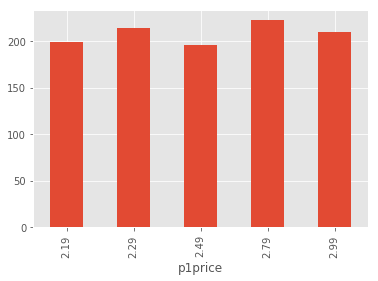

In [9]:
# Graph the counts of each p1price in year 1
# ... this is the data
price_frequencies = df_store.loc[df_store.Year==2013,:].groupby(['p1price']).size()
price_frequencies
# ... plot the pandas object
price_frequencies.plot(kind='bar')


### Continuous Variables

In [10]:
df_store.p1sales.min()
df_store.p1sales.max()
df_store.p1sales.mean()
df_store.p1sales.median()
df_store.p1sales.var() # variance
df_store.p1sales.std() # standard deviation
df_store.p1sales.mad()
printmd('all of these could also be done on the full DataFrame...', color='blue')
df_store.min()
# in the .quantile() method below, a series is returned, but the
# row index in pandas can be labels.  So it labels the rows with
# the quantile (i.e. 0.25, 0.5, 0.75).  
# Don't confuse the result below as being a DataFrame with two
# columns -- it is just a single column of numbers with row labels that
# happen to be numbers :-)
printmd('quantile output is a series with row labels', color='blue')
df_store.p1sales.quantile([0.25, 0.5, 0.75])
def IQR(arr):
    q = arr.quantile([0.25, 0.75])
    return q.loc[0.75] - q.loc[0.25] #note that these numbers are index *labels*, not numbers
IQR(df_store.p1sales)
# deciles
df_store.p1sales.quantile([x/10 for x in range(1, 11, 1)])

64.0

269.0

132.41153846153847

128.0

862.0171828171794

29.360129134885963

23.177463017751432

<span style='color:blue'>all of these could also be done on the full DataFrame...</span>

storeNum                    101
country                      AU
Date        2013-01-06 00:00:00
Year                       2013
Week                          1
p1sales                      64
p2sales                      63
p1price                    2.19
p2price                    2.29
p1prom                        0
p2prom                        0
dtype: object

<span style='color:blue'>quantile output is a series with row labels</span>

0.25    111.0
0.50    128.0
0.75    150.0
Name: p1sales, dtype: float64

39.0

0.1     98.0
0.2    107.0
0.3    115.0
0.4    122.0
0.5    128.0
0.6    136.0
0.7    145.0
0.8    156.0
0.9    173.0
1.0    269.0
Name: p1sales, dtype: float64

### Creating tables and changing the index and column labels

In [11]:
# create a summary dataframe showing product1 vs. product2 stats
printmd('Create summary dataframe - just the skeletal shape first: Option 1', color='blue')
columns=['Median Sales', 'IQR']
mysummary = pd.DataFrame(data=np.zeros(shape=(2, 2))) # could have specified columns=[] or index=[] here...
mysummary
printmd('....rename(): Now rename the index and column labels', color='blue')
mysummary.rename({0:'p1sales', 1:'p2sales'}, axis='index', inplace=True)  # rename the index labels
mysummary.rename({0:'Median Sales', 1:'IQR'}, axis='columns', inplace=True) # rename the column labels
mysummary
printmd('...finally insert the values', color='blue')
mysummary['Median Sales'] = df_store.loc[:,['p1sales','p2sales']].apply(func=np.mean, axis=0)  # because of space in label, us []-style column selector rather than dot.
mysummary.IQR = df_store.loc[:,['p1sales','p2sales']].apply(func=IQR, axis=0)
mysummary
printmd('Create summary dataframe: Option 2 (better)', color='red')
index = ['p1sales', 'p2sales']
mysummary = pd.DataFrame({  'Median_Sales': df_store.loc[:,index].apply(func=np.mean, axis=0),
                            'IQR':          df_store.loc[:,index].apply(func=IQR, axis=0)},
                            index=index)
mysummary
printmd('...reindex(): can insert new index and it creates spaces for new ones', color='red')
mysummary.reindex(['p1sales', 'p2sales', 'p3sales']) # since 'inplace' is not specified this create new dataframe, doesn't modify existing one.
printmd('...rename(): or map to new index names using a function instead of a dict-like', color='red')
mysummary.rename(index=str.upper, columns=str.lower)
printmd('...reset_index(): go to default integer row index and original column names...', color='red')
mysummary.reset_index(inplace=True) #go to default integer row index and original column names...
mysummary
printmd('...set_index(): use one of the columns for the row index...', color='red')
mysummary.set_index(keys='index', inplace=True) #the reset_index had created an column named 'index' so we didn't lose that info -- specify it to return these index labels.
mysummary

<span style='color:blue'>Create summary dataframe - just the skeletal shape first: Option 1</span>

,0,1
0,0.0,0.0
1,0.0,0.0


<span style='color:blue'>....rename(): Now rename the index and column labels</span>

,Median Sales,IQR
p1sales,0.0,0.0
p2sales,0.0,0.0


<span style='color:blue'>...finally insert the values</span>

,Median Sales,IQR
p1sales,132.411538,39.00
p2sales,121.652885,38.25


<span style='color:red'>Create summary dataframe: Option 2 (better)</span>

,Median_Sales,IQR
p1sales,132.411538,39.00
p2sales,121.652885,38.25


<span style='color:red'>...reindex(): can insert new index and it creates spaces for new ones</span>

,Median_Sales,IQR
p1sales,132.411538,39.00
p2sales,121.652885,38.25
p3sales,NaN,NaN


<span style='color:red'>...rename(): or map to new index names using a function instead of a dict-like</span>

,median_sales,iqr
P1SALES,132.411538,39.00
P2SALES,121.652885,38.25


<span style='color:red'>...reset_index(): go to default integer row index and original column names...</span>

,index,Median_Sales,IQR
0,p1sales,132.411538,39.00
1,p2sales,121.652885,38.25


<span style='color:red'>...set_index(): use one of the columns for the row index...</span>

,Median_Sales,IQR
index,,
p1sales,132.411538,39.00
p2sales,121.652885,38.25


### Single Variable Visualization

### Histogram

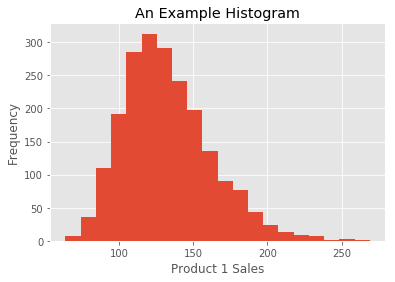

In [12]:
ax = df_store.p1sales.plot.hist(bins= 20, title='An Example Histogram') # ax is a returned Matplotlib Axes object
ax.set_xlabel('Product 1 Sales'); # the semicolon here prevents the value from being pretty-printed

## Altair version (and Altair Tutorial Diversion)

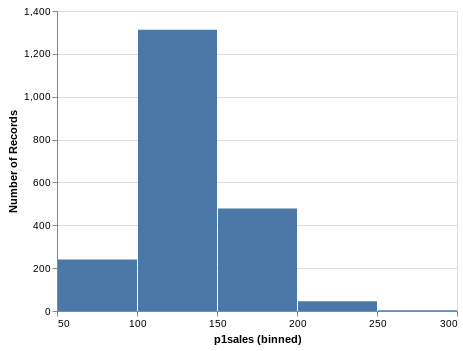

In [15]:
# Using Altair -- simple version
alt.Chart(df_store).mark_bar().encode(
    alt.X("p1sales", bin=True),
    y='count()',
)

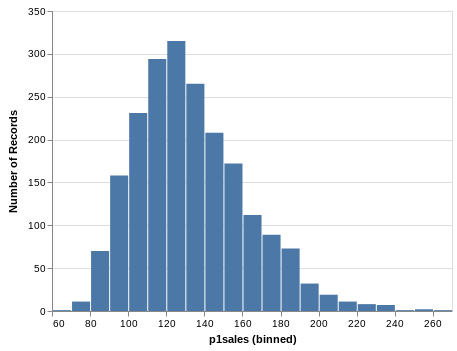

In [16]:
# Using Altair with more sophistication
alt.Chart(df_store).mark_bar().encode(
    alt.X("p1sales", bin=alt.Bin(maxbins=30)),
    y='count()',
)

A great reference for customizing Altair configurations is at [this page on the Altair documentation site](https://altair-viz.github.io/user_guide/customization.html?highlight=scheme)

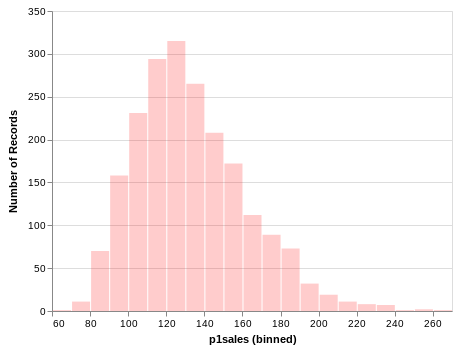

In [17]:
# using the global config
alt.Chart(df_store).mark_bar().encode(
    alt.X("p1sales", bin=alt.Bin(maxbins=30)),
    y='count()'
).configure_mark(
    opacity=0.2,
    color='red'
)

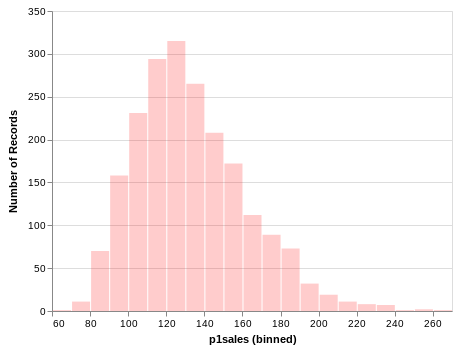

In [18]:
# using the local config
# note also the alternative y specification
alt.Chart(df_store).mark_bar(opacity=0.2, color='red').encode(
    alt.X("p1sales", bin=alt.Bin(maxbins=30)),
    y=alt.Y(aggregate='count', type='quantitative')
)

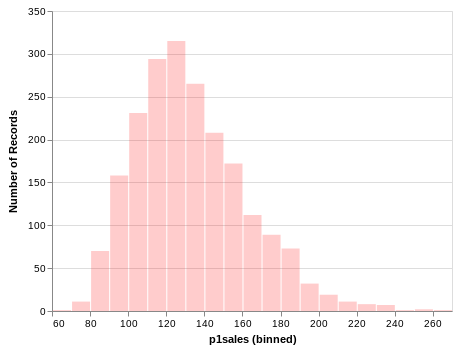

In [19]:
# using the encoding (but specifying a value instead of mapping to each data point)
# using the global config
alt.Chart(df_store).mark_bar().encode(
    alt.X("p1sales", bin=alt.Bin(maxbins=30)),
    y='count()',
    color=alt.value('red'),
    opacity=alt.value(0.2)
)

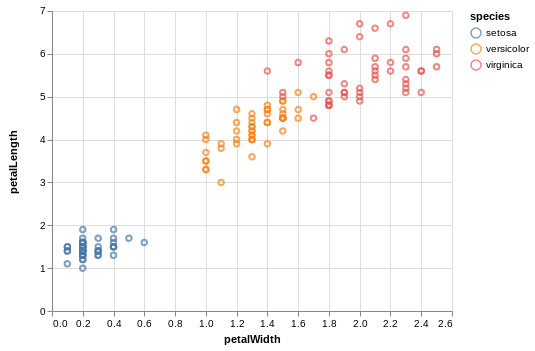

In [20]:
# encoding is more typically used to map colors onto data values like in this example
import altair as alt
from vega_datasets import data

iris = data.iris()

chart = alt.Chart(iris).mark_point().encode(
    x='petalWidth',
    y='petalLength',
    color='species'
)
chart

There are also color schemes which Altair gets from Vega and can be found documented on the [Vega documentation here](https://vega.github.io/vega/docs/schemes/)

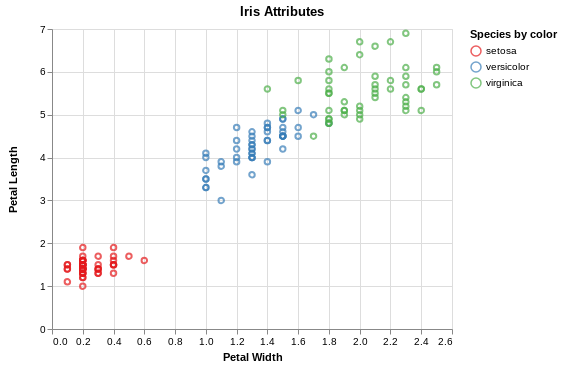

In [21]:
# More detail in the specification...

alt.Chart(iris, title="Iris Attributes").mark_point().encode(
        alt.X(field='petalWidth', type="quantitative", title="Petal Width"),
        alt.Y(field='petalLength', type="quantitative", title="Petal Length"),
        color=alt.Color('species', scale=alt.Scale(scheme='set1'), legend=alt.Legend(title="Species by color"))
    ).interactive()

### Altair themes

[Great blog post on Altair themes](https://towardsdatascience.com/consistently-beautiful-visualizations-with-altair-themes-c7f9f889602)

[Themes on Github](https://github.com/vega/vega-themes/tree/master/src)

[Altair documentation page on themes (scroll down)](https://altair-viz.github.io/user_guide/configuration.html?highlight=theme)

[Vega Themes (would need to be put in Altair format)](https://github.com/vega/vega-themes/tree/master/src)

ThemeRegistry.enable('default')

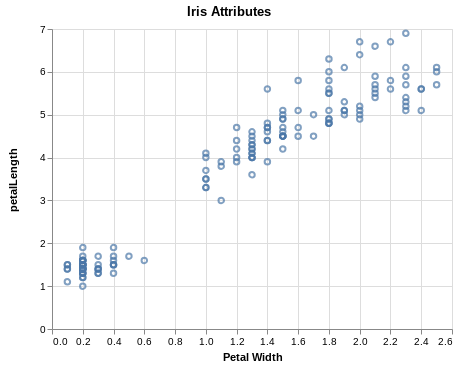

In [22]:
# a new chart to talk about themes
alt.themes.enable('default')

chart = alt.Chart(iris, title="Iris Attributes").mark_point().encode(
            alt.X(field='petalWidth', type="quantitative", title="Petal Width"), # using alt.X() lets me specify title
            y='petalLength:Q',  # :Q is shortcut for type="quantitative"
).interactive()
chart

In [23]:
# list the themes available
alt.themes.names()
# show what is in the default theme
default = alt.themes.get()
default()

['default', 'none', 'opaque']

{'config': {'view': {'width': 400, 'height': 300}}}

ThemeRegistry.enable('opaque')

{'background': 'white', 'view': {'width': 400, 'height': 300}}

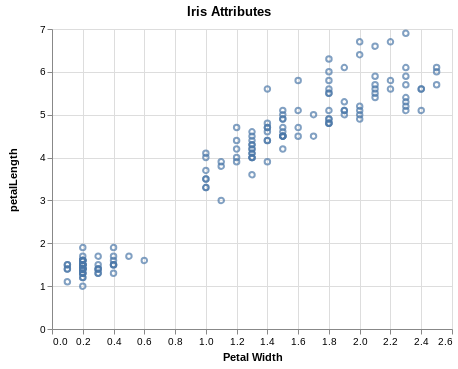

In [24]:
# specify a theme
alt.themes.enable('opaque')
# show that the chart object (from several charts above) has
# this new theme inserted into it (it has 'background':'white', which
# is the primary thing the 'opaque' theme changes)
chart.to_dict()['config']
chart

<function __main__.black_marks()>

ThemeRegistry.enable('black_marks')

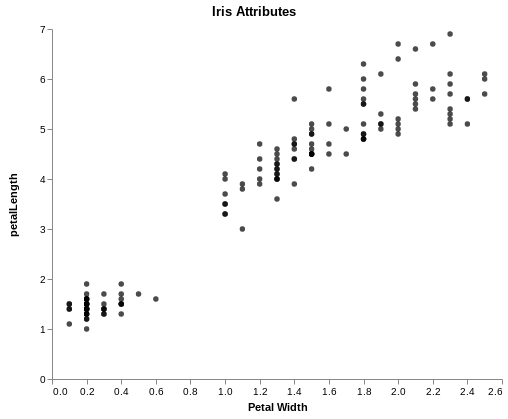

In [25]:
# Defining a custom theme
# define the theme by returning the dictionary of configurations
def black_marks():
    return {
        'config': {
            'view': {
                'height': 350,
                'width': 450,
                'strokeWidth': 0
            },
            'mark': {
                'color': 'black',
                'fill': 'black'
            },
            'axis': {
                'grid': False
            }
        }
    }

# register the custom theme under a chosen name
alt.themes.register('black_marks', black_marks)

# enable the newly registered theme
alt.themes.enable('black_marks')

# print the chart with this new theme
chart

<function __main__.my_custom_theme()>

ThemeRegistry.enable('my_theme')

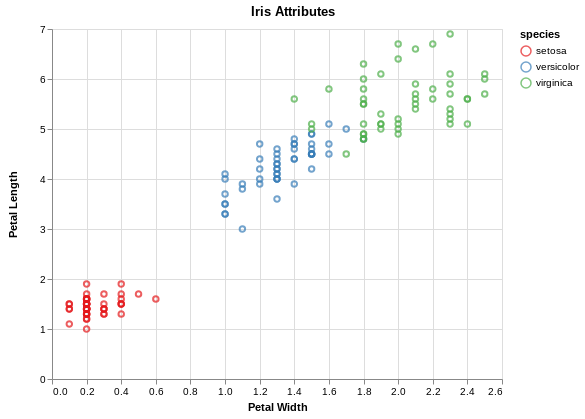

In [26]:
# Defining a custom theme with a specified color scheme
# define the theme by returning the dictionary of configurations

def my_custom_theme():
    return {
        'config': {
            'view': {
                'height': 350,
                'width': 450,
            },

            # defaults for scale ranges
            'range': {
              'category': {'scheme': 'set1'}, # default: 'tableau10'
              #'category':["#5079a5","#ef8e3b","#dd565c","#79b7b2","#5da052","#ecc853",
              #            "#ad7aa1","#ef9ba7","#9b7461","#bab0ac"],
              'ordinal': {'scheme': 'reds', 'extent': [0.2, 1]},  # default: 'blues'
              'heatmap': {'scheme': 'viridis'},                 # default: 'viridis'
              'ramp': {'scheme': 'reds','extent': [0.2, 1]},  # default: 'blues'
              'diverging': {'scheme': 'blueorange'},        # default: 'blueorange'
              'symbol': ['circle','square','triangle-up','cross','diamond','triangle-right','triangle-down','triangle-left',
                #'circle','square','triangle-up','cross','diamond','triangle-right','triangle-down','triangle-left'
              ]
            }
        }
    }

# register the custom theme under a chosen name
alt.themes.register('my_theme', my_custom_theme)

# enable the newly registered theme
alt.themes.enable('my_theme')
alt.Chart(iris, title="Iris Attributes").mark_point().encode(
        alt.X(field='petalWidth', type="quantitative", title="Petal Width"),
        alt.Y(field='petalLength', type="quantitative", title="Petal Length"),
        color='species'
    ).interactive()

Install the Lato Font

In [27]:
%%html
<style>
@import url('https://fonts.googleapis.com/css?family=Lato');
</style>

<function __main__.urban_theme()>

ThemeRegistry.enable('urban_theme')

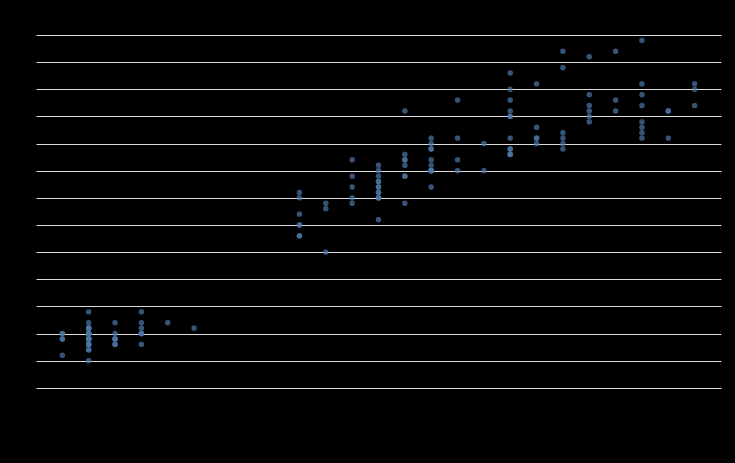

In [28]:
def urban_theme():
    # Typography
    font = "Lato"  # was Lato
    # At Urban it's the same font for all text but it's good to keep them separate in case you want to change one later.
    labelFont = "Lato" 
    sourceFont = "Lato"
    # Axes
    axisColor = "#000000"
    gridColor = "#DEDDDD"
    # Mark
    markColor = "#cfe8f3"
    # Colors
    main_palette = ["#1696d2", 
                    "#d2d2d2",
                    "#000000", 
                    "#fdbf11", 
                    "#ec008b", 
                    "#55b748", 
                    "#5c5859", 
                    "#db2b27", 
                   ]
    sequential_palette = ["#cfe8f3", 
                          "#a2d4ec", 
                          "#73bfe2", 
                          "#46abdb", 
                          "#1696d2", 
                          "#12719e", 
                         ]
    return {
        # width and height are configured outside the config dict because they are Chart configurations/properties not chart-elements' configurations/properties.
        "width": 685, # from the guide
        "height": 380, # not in the guide
        "config": {
            "title": {
                "fontSize": 18,
                "font": font,
                "anchor": "start", # equivalent of left-aligned.
                "fontColor": "#000000"
            },
            "axisX": {
                "domain": True,
                "domainColor": axisColor,
                "domainWidth": 1,
                "grid": False,
                "labelFont": labelFont,
                "labelFontSize": 12,
                "labelAngle": 0, 
                "tickColor": axisColor,
                "tickSize": 5, # default, including it just to show you can change it
                "titleFont": font,
                "titleFontSize": 12,
                "titlePadding": 10, # guessing, not specified in styleguide
                "title": "X Axis Title (units)", 
            },
            "axisY": {
                "domain": False,
                "grid": True,
                "gridColor": gridColor,
                "gridWidth": 1,
                "labelFont": labelFont,
                "labelFontSize": 12,
                "labelAngle": 0, 
                "ticks": False, # even if you don't have a "domain" you need to turn these off.
                "titleFont": font,
                "titleFontSize": 12,
                "titlePadding": 10, # guessing, not specified in styleguide
                "title": "Y Axis Title (units)", 
                # titles are by default vertical left of axis so we need to hack this 
                "titleAngle": 0, # horizontal
                "titleY": -10, # move it up
                "titleX": 18, # move it to the right so it aligns with the labels 
            },
            "range": {
                "category": main_palette,
                "diverging": sequential_palette,
            },
            "legend": {
                "labelFont": labelFont,
                "labelFontSize": 12,
                "symbolType": "square", # just 'cause
                "symbolSize": 100, # default
                "titleFont": font,
                "titleFontSize": 12,
                "title": "", # set it to no-title by default
                "orient": "top-left", # so it's right next to the y-axis
                "offset": 0, # literally right next to the y-axis.
            },
            "view": {
                "stroke": "transparent", # altair uses gridlines to box the area where the data is visualized. This takes that off.
            },
            "background": {
                "color": "#FFFFFF", # white rather than transparent
            },
            ### MARKS CONFIGURATIONS ###
            "area": {
               "fill": markColor,
           },
           "line": {
               "color": markColor,
               "stroke": markColor,
               "strokeWidth": 5,
           },
           "trail": {
               "color": markColor,
               "stroke": markColor,
               "strokeWidth": 0,
               "size": 1,
           },
           "path": {
               "stroke": markColor,
               "strokeWidth": 0.5,
           },
           "point": {
               "filled": True,
           },
           "text": {
               "font": sourceFont,
               "color": markColor,
               "fontSize": 11,
               "align": "right",
               "fontWeight": 400,
               "size": 11,
           }, 
           "bar": {
                "size": 40,
                "binSpacing": 1,
                "continuousBandSize": 30,
                "discreteBandSize": 30,
                "fill": markColor,
                "stroke": False,
            },
        }
    }

alt.themes.register("urban_theme", urban_theme)
alt.themes.enable("urban_theme")
chart

### Back to Histograms...

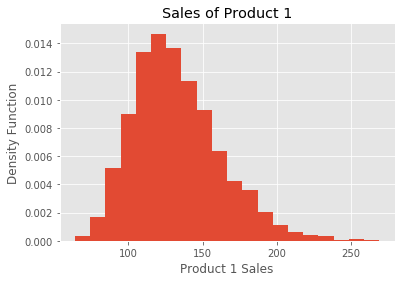

In [29]:
# back to histograms...
# more control...
plt.hist(df_store.p1sales, 
         bins=20,
         density=True,  # use density estimate instead of freq count for comparability
        )
plt.xlabel('Product 1 Sales');
plt.ylabel('Density Function');
plt.title('Sales of Product 1');

/home/danny/anaconda2/envs/py3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



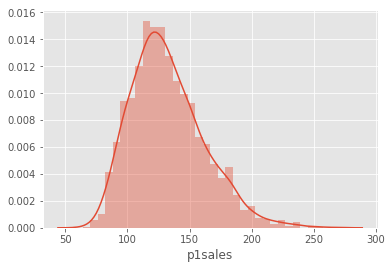

In [30]:
sns.distplot(df_store.p1sales);

### BoxPlots

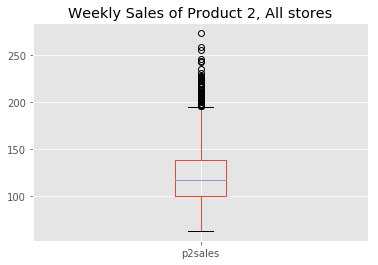

In [31]:
ax = df_store.p2sales.plot.box(title='Weekly Sales of Product 2, All stores');

Text(0.5, 1.0, 'Weekly Sales of Product 2 by Store Number')

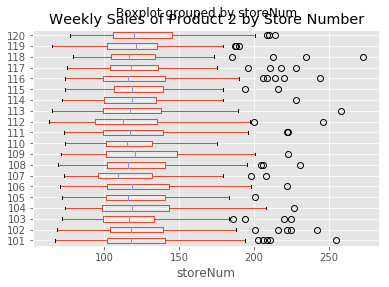

In [32]:
#ax = df_store.loc[:,['storeNum','p2sales']].groupby(['storeNum']).plot.box(title='Weekly Sales of Product 2', vert=False);
ax = df_store.boxplot(column='p2sales', by='storeNum', vert=False)
ax.set_title('Weekly Sales of Product 2 by Store Number')

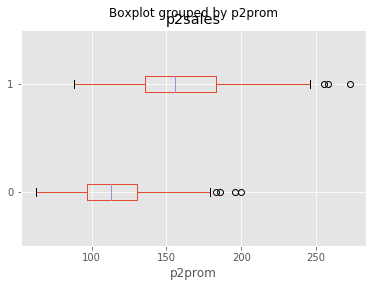

In [33]:
# Product sales by promotion status
ax = df_store.boxplot(column='p2sales', by='p2prom', vert=False)

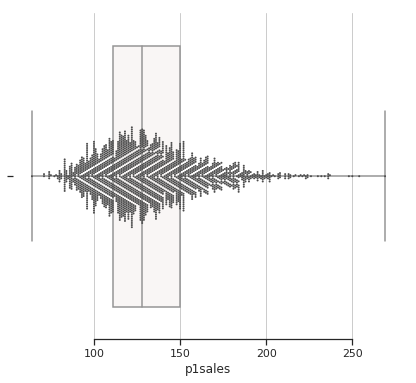

In [34]:
# Boxplot with observations using seaborn

sns.set(style="ticks")

# Initialize the figure with a logarithmic x axis
f, ax = plt.subplots(figsize=(7, 6));
#ax.set_xscale("log")

sns.boxplot(x="p1sales", data=df_store,
            whis="range", 
            palette="vlag")

# Add in points to show each observation
sns.swarmplot(x="p1sales", data=df_store, size=2, color=".3", linewidth=0)

# Tweak the visual presentation
ax.xaxis.grid(True);
ax.set(ylabel="");
sns.despine(trim=True, left=True);

### QQ Plot to Check Normality
Checks to see if your distribution is normal (or follows any other distribution you specify)
This first one shows what it looks like when the fit is good (i.e it is normal)

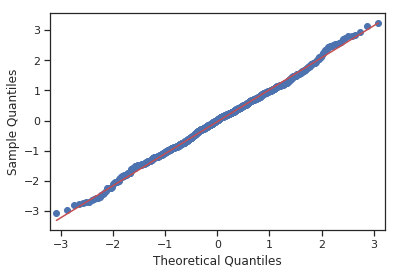

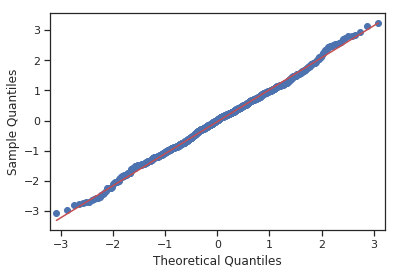

In [35]:
test = np.random.normal(0,1, 1000)

#sm.qqplot(test, dist=scipy.stats.distributions.norm, line='45')
sm.qqplot(test, dist=scipy.stats.distributions.norm, line='q')

Our data does not look normally distributed

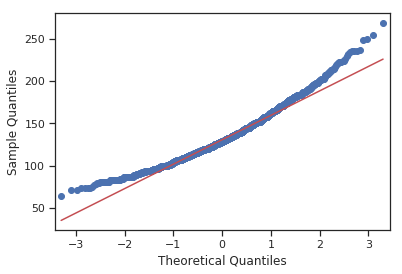

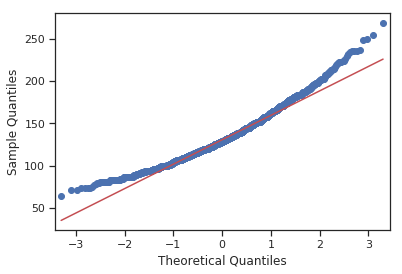

In [36]:
sm.qqplot(df_store.p1sales, dist=scipy.stats.distributions.norm, line='q')

### Cumulative Distribution Graphs and KDE

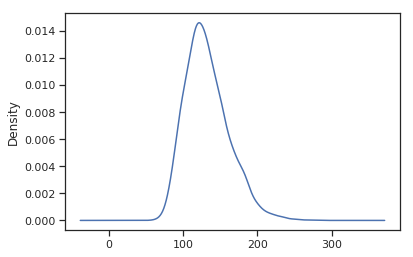

In [37]:
df_store.p1sales.plot.kde(); # look at the shape of the KDE

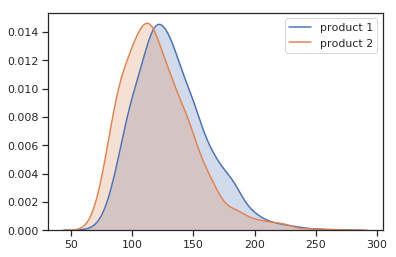

In [38]:
sns.kdeplot(df_store.p1sales, shade=True, label='product 1');
sns.kdeplot(df_store.p2sales, shade=True, label='product 2');
plt.legend();

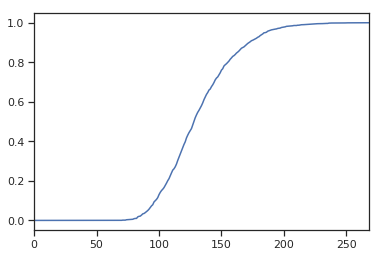

In [39]:
# Cumulative distribution
from statsmodels.distributions.empirical_distribution import ECDF
ecdf = ECDF(df_store.p1sales)
# the return from ECDF is a stepfunction.  Feed it values and it
# will return the CDF at those values.  Let's feed it zero to max(p1sales)
# and plot it.
pd.Series(ecdf(range(int(max(df_store.p1sales))))).plot()

### Maps -- data on geographic information

In [38]:
data = [ dict(
        type = 'choropleth',
        locations = df_store.country,
        z = df_store.p1sales,
        text = df_store.country,
#        colorscale = [[0,"rgb(5, 10, 172)"],[0.35,"rgb(40, 60, 190)"],[0.5,"rgb(70, 100, 245)"],\
#            [0.6,"rgb(90, 120, 245)"],[0.7,"rgb(106, 137, 247)"],[1,"rgb(220, 220, 220)"]],
#        autocolorscale = False,
        autocolorscale = True,
    
        reversescale = True,
        marker = dict(
            line = dict (
                color = 'rgb(180,180,180)',
                width = 0.5
            )
        ),
        zmin = 0,
        colorbar = dict(
            tick0 = 0,
            dtick = 1000,
#            autotick = False,
            tickprefix = '$',
            title = 'US$'
        ),
    ) ]

layout = dict(
    title = 'P1 Product Sales by Country<br>Source: \
<a href="https://www.cia.gov/library/publications/the-world-factbook/fields/2195.html">\
CIA World Factbook</a>',
    geo = dict(
        showframe = False,
        showcoastlines = False,
        projection = dict(
            type = 'mercator'
        )
    )
)

fig = dict( data=data, layout=layout )
url = py.plot(fig, filename='d3-world-map')
url

'https://plot.ly/~dyoung418/10'

## Danny's Extra Plot Types

### Variable Width Bar Charts

In [42]:
# Let's show price and sales by country in a variable width bar chart
# with price on vertical axes and unit sales as width and the bars
# sorted by price from high to low
df_store.sample(1)

graph_data = df_store.loc[df_store.Year==k_start_year,:].groupby(['country']).agg({'p1sales':'sum','p1price':'mean'})
graph_data = graph_data.sort_values(by='p1price', ascending=False) # Sort by price
graph_data



#plt.bar()

,storeNum,country,Date,Year,Week,p1sales,p2sales,p1price,p2price,p1prom,p2prom
1275,116,JP,2014-03-23,2014,12,169.0,102.0,2.29,2.99,0,0


,p1sales,p1price
country,,
CN,13989.0,2.587115
DE,34396.0,2.568462
JP,27409.0,2.553462
US,20588.0,2.548333
GB,20684.0,2.545128
AU,6909.0,2.543846
BR,13932.0,2.532308


Year        Week        p1sales              p2sales              \
            sum  mean   sum  mean      sum        mean      sum        mean   
country                                                                       
CN       209352  2013  2756  26.5  13989.0  134.509615  13136.0  126.307692   
DE       523380  2013  6890  26.5  34396.0  132.292308  31612.0  121.584615   
JP       418704  2013  5512  26.5  27409.0  131.774038  25628.0  123.211538   
US       314028  2013  4134  26.5  20588.0  131.974359  19499.0  124.993590   
GB       314028  2013  4134  26.5  20684.0  132.589744  18853.0  120.852564   
AU       104676  2013  1378  26.5   6909.0  132.865385   6486.0  124.730769   
BR       209352  2013  2756  26.5  13932.0  133.961538  12485.0  120.048077   

        p1price           p2price           p1prom           p2prom            
            sum      mean     sum      mean    sum      mean    sum      mean  
country                                                                        
CN       269.06  2.587115  281.06  2.702500     17  0.163462     23  0.221154  
DE       667.80  2.568462  700.30  2.693462     23  0.088462     31  0.119231  
JP       531.12  2.553462  562.22  2.702981     20  0.096154     38  0.182692  
US       397.54  2.548333  421.04  2.698974     10  0.064103     29  0.185897  
GB       397.04  2.545128  423.84  2.716923      9  0.057692     24  0.153846  
AU       132.28  2.543846  139.28  2.678462      7  0.134615      7  0.134615  
BR       263.36  2.532308  284.06  2.731346      6  0.057692     19  0.182692

country
CN    2.587115
DE    2.568462
JP    2.553462
US    2.548333
GB    2.545128
AU    2.543846
BR    2.532308
Name: mean, dtype: float64

raw values are [13989.0, 34396.0, 27409.0, 20588.0, 20684.0, 6909.0, 13932.0]
bar_edges = [0, 13989.0, 48385.0, 75794.0, 96382.0, 117066.0, 123975.0]
bar_centers = [6994.5, 31187.0, 62089.5, 86088.0, 106724.0, 120520.5, 130941.0]


country
CN    13989.0
DE    34396.0
JP    27409.0
US    20588.0
GB    20684.0
AU     6909.0
BR    13932.0
Name: (p1sales, sum), dtype: float64

['Solarize_Light2', '_classic_test', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-bright', 'seaborn-colorblind', 'seaborn-dark-palette', 'seaborn-dark', 'seaborn-darkgrid', 'seaborn-deep', 'seaborn-muted', 'seaborn-notebook', 'seaborn-paper', 'seaborn-pastel', 'seaborn-poster', 'seaborn-talk', 'seaborn-ticks', 'seaborn-white', 'seaborn-whitegrid', 'seaborn', 'tableau-colorblind10']


<BarContainer object of 7 artists>

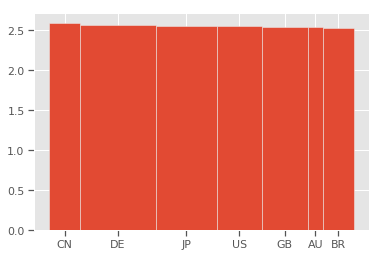

In [47]:
graph_data = df_store.loc[df_store.Year==k_start_year,:].groupby(['country']).agg(['sum', 'mean'])
# now sort this by the p1prices from high to low...
graph_data = graph_data.sort_values(by=[('p1price', 'mean')], ascending=False) # here the multi-index must be supplied as a tuple for "by="
graph_data
# examples of how to index a multi-index table like this
graph_data['p1price']['mean'] # one way to index on multi-indexed axes
#graph_data['p1price','mean']  # a second way..

# For plotting, we will need to specify the x coordinates for each bar.
# this would be easiest to do with the left edge of the bar by using
# the align='left' option of plt.bar().  (e.g. start
# at 0 then use the cumsum() of the rest of the bar widths)
# This is an example:
print('raw values are {}'.format(graph_data.loc[:,('p1sales','sum')].tolist()))
bar_edges = [0] + graph_data.iloc[:-1,:].loc[:,('p1sales','sum')].cumsum().tolist()
print('bar_edges = {}'.format(bar_edges))
# HOWEVER, this will also be where the tick labels are placed and having
# the tick labels at the left edges looks funny.
# SO, we need to calculate the bar centers for each of the variable width bars
# and then use align='center'
# here is an example:
bar_centers = graph_data.loc[:,('p1sales','sum')].expanding(1).apply(func=lambda x: x.sum() - x[-1] + (x[-1]/2), raw=False).tolist()
print('bar_centers = {}'.format(bar_centers))
# for this, we need a cumulative sum of the widths of the bars, which will be unit sales:
graph_data.loc[:,('p1sales','sum')]


print(plt.style.available)
plt.style.use('ggplot')

plt.bar(
    # For plotting, we will need to specify the x coordinates for the edges of each bar.
    # for this, we need a cumulative sum of the widths of the bars, which will be unit sales:
    x=bar_centers, 
    height=graph_data['p1price']['mean'], # specify height as normal
    width=graph_data['p1sales']['sum'], # here is where we specify the width which we usually leave defaulted
    align='center',
    tick_label=graph_data.index,
    log=False)

In [48]:
def plot_variable_bar(height, width=0.8, data=None, **kwds):
    '''Create a variable-width bar chart from values or a Pandas dataframe.
    Arguments:
    height: required: str or Series. If str, it is column name from data
    width: scalar, str or Series; default:0.8
    data: dataframe; default:None
    **kwds: will be passed onto matplotlib.pyplot.plot.bar()'''
    import matplotlib.pyplot as plt
    
    if (type(height) is str) or (type(height) is tuple):
        if data is None:
            raise ValueError("Must provide data= argument if using string for height")
        else: height = data.loc[:,height]
    if (type(width) is str) or (type(width) is tuple):
        if data is None:
            raise ValueError("Must provide data= argument if using string for width")
        else: 
            width = data.loc[:,width]
            bar_centers = midpoints(width)
    elif type(width) is int:
        bar_centers = [(width/2)*barnum for barnum in range(len(height))]
    else:
        bar_centers = midpoints(width)

    plt.bar(
        # For plotting, we will need to specify the x coordinates for the edges of each bar.
        # for this, we need a cumulative sum of the widths of the bars, which will be unit sales:
        x=bar_centers, 
        height=height, # specify height as normal
        width=width, # here is where we specify the width which we usually leave defaulted
        align='center',
        **kwds)

def midpoints(series):
    return series.expanding(1).apply(func=lambda x: x.sum() - x.iloc[-1] + (x.iloc[-1]/2), raw=False).tolist()
            

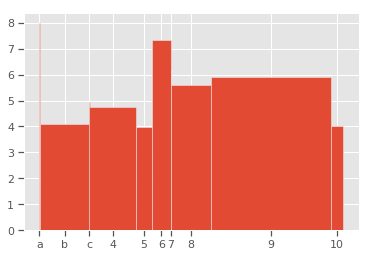

In [49]:
plot_variable_bar(
    height=pd.Series(np.random.normal(loc=5, scale=2, size=10)),
    width=pd.Series(np.random.normal(loc=5, scale=3, size=10)),
    tick_label=['a','b','c','4','5','6','7','8','9','10'])

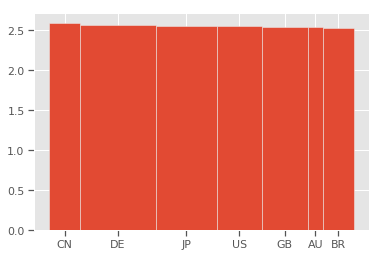

In [50]:
plot_variable_bar(height=('p1price','mean'), 
                  width=('p1sales','sum'), 
                  data=graph_data,
                 tick_label=graph_data.index)